In [1]:
from keras.datasets import cifar10
import numpy as np
(X_train, y_trian), (X_test, y_test) = cifar10.load_data()

X_train_norm = X_train.astype(np.float32)/255.
X_test_norm = X_test.astype(np.float32)/255.

Using TensorFlow backend.


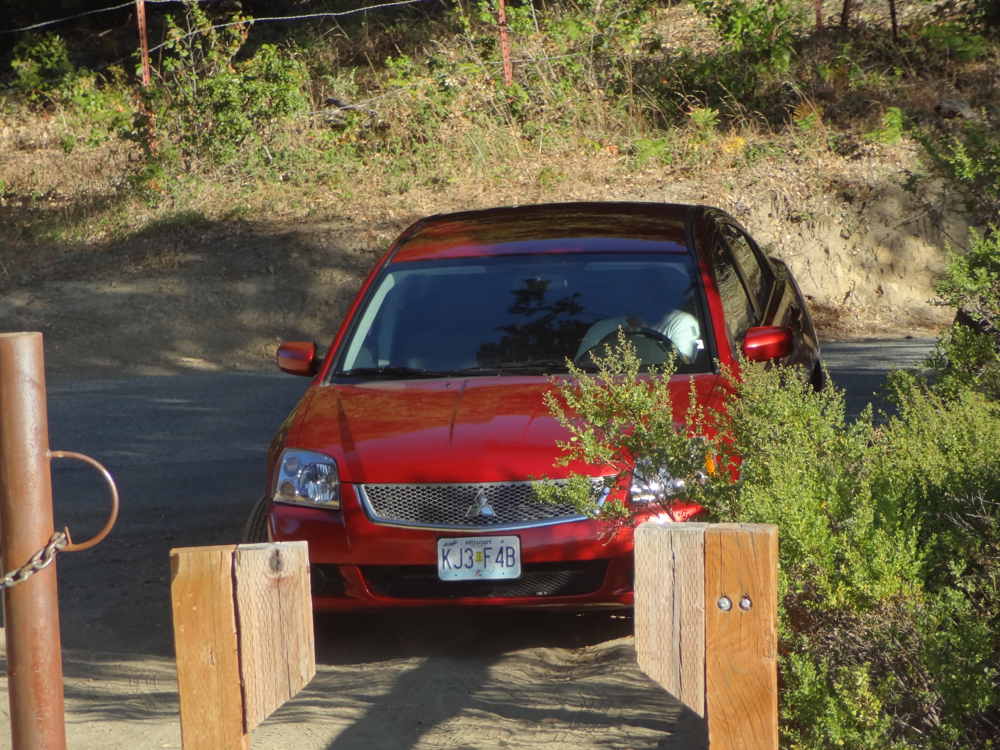

In [2]:
from PIL import Image

img = Image.open("./images/bild1.jpg")
#img = img.resize((round(img.size[0]*0.1), round(img.size[1]*0.1)), resample=Image.BICUBIC)
img

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt

In [4]:
from keras.models import load_model

model = load_model("Saved Samples/cifar10_car_9998.b5")

In [21]:
from PIL import ImageDraw

img = Image.open("./images/bild1.jpg")
draw = ImageDraw.Draw(img)

points=[img.size[0],img.size[1],0,0]

count = 0
factor = 400
steps = 100
#-factor+round(img.size[1]/steps)
for y in range(0,img.size[1], round(img.size[1]/steps)):
    for x in range(0,img.size[0], round(img.size[0]/steps)):
        crop = img.crop((x,y,x+factor,y+factor)).resize((32,32), resample=Image.BICUBIC)
        data = np.asarray(crop).astype(np.float32)/255.
        value = model.predict(data.reshape(1,32,32,3))>=0.8
        if(value):
            if(x<points[0]):
                points[0] = x
            if(y<points[1]):
                points[1] = y
            if(x+factor>points[2]):
                points[2] = x+factor
            if(y+factor>points[3]):
                points[3] = y+factor

draw.rectangle([(points[0],points[1]),(points[2],points[3])], outline="yellow")            

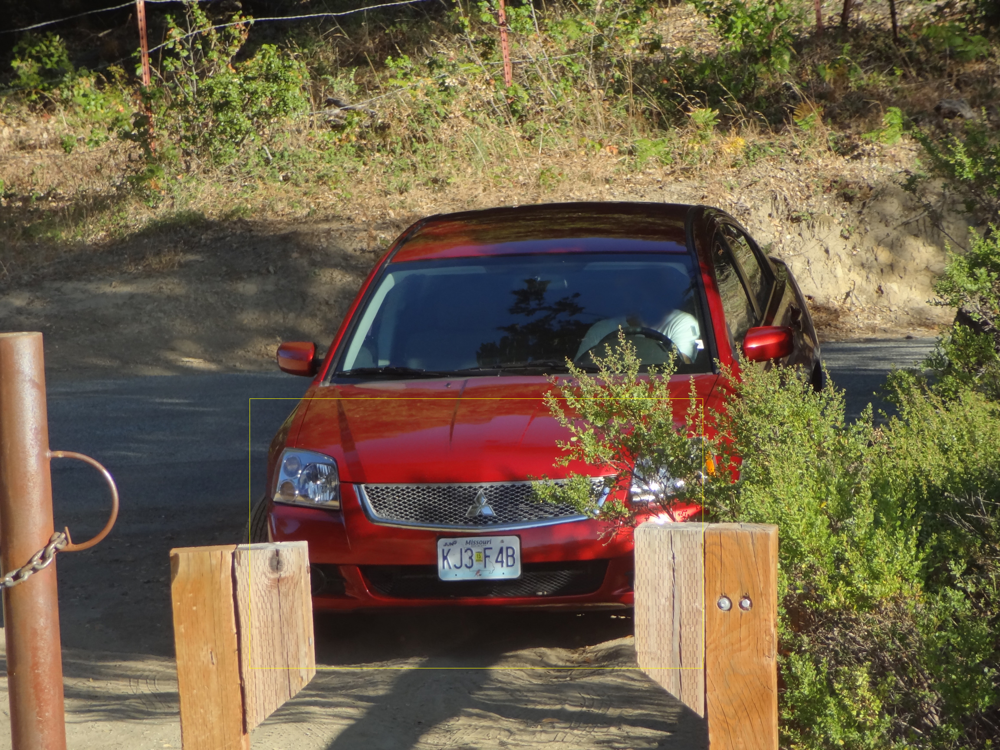

In [22]:
img

# viertel rechts-oben des Bilds wird als kein Auto berechnet

In [25]:
crop=img.crop((img.size[0]*0.5,0,img.size[0],img.size[1]*0.5)).resize((32,32), resample=Image.BICUBIC)
data = np.asarray(crop).astype(np.float32)/255.
model.predict(data.reshape(1,32,32,3))

array([[0.00145771]], dtype=float32)